In [1]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import glob
%matplotlib inline


In [2]:
# reading all the images
images = glob.glob('camera_cal/GOPR00*.jpg')

#storing image point and object points
objpoints = [] #3d points in real world space
imgpoints = [] #2d points

nx = 8
ny = 6

objp = np.zeros((6*8,3), np.float32)
objp[:,:2] = np.mgrid[0:8,0:6].T.reshape(-1,2)

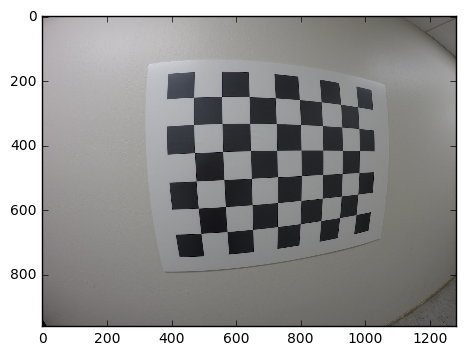

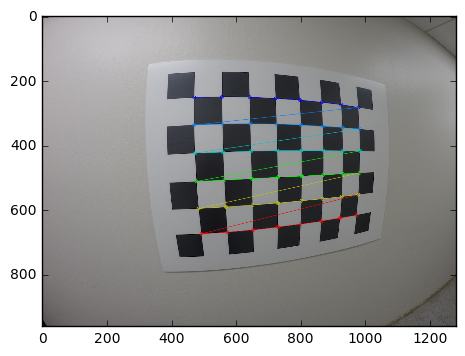

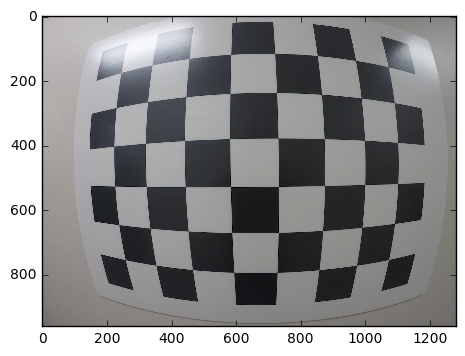

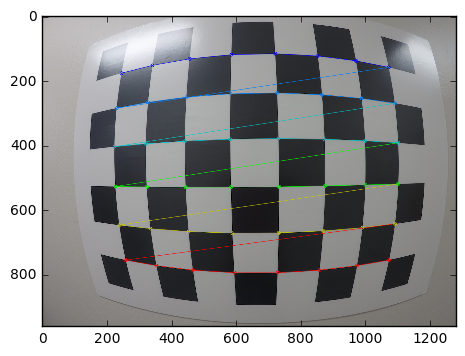

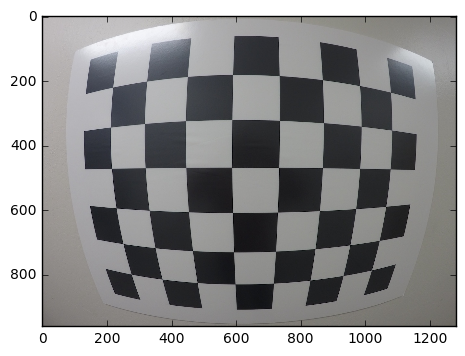

...

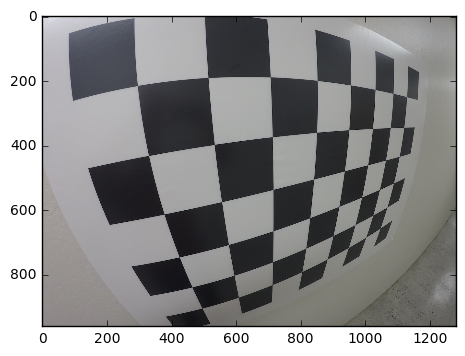

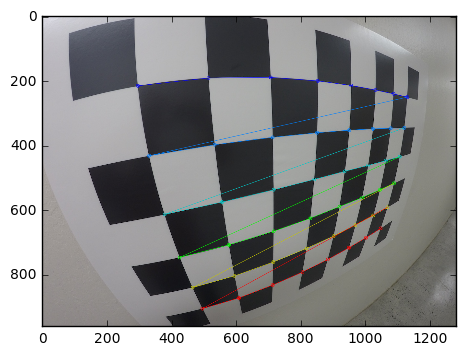

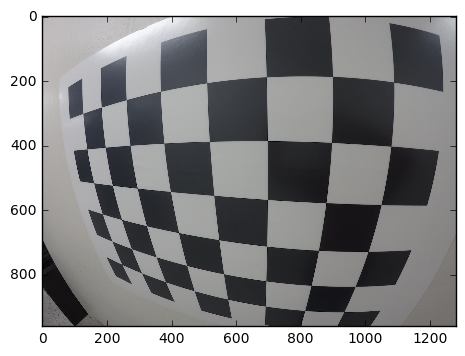

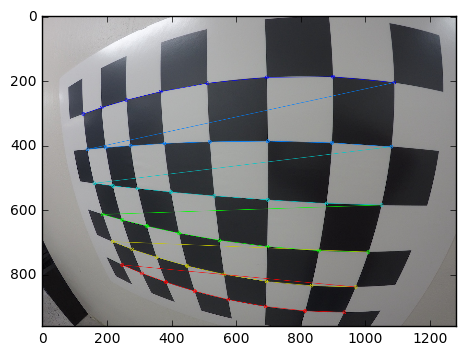

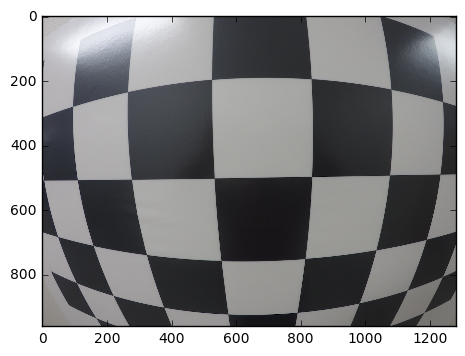

FALSE


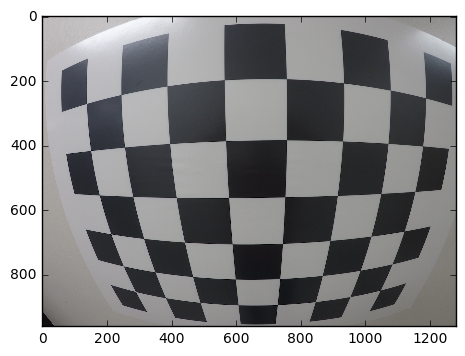

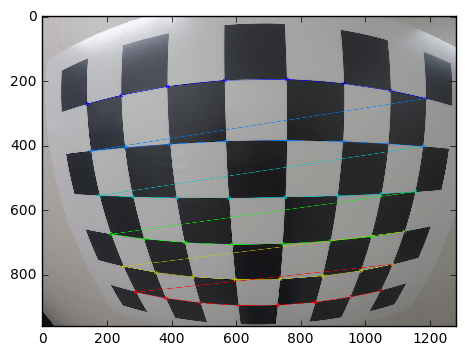

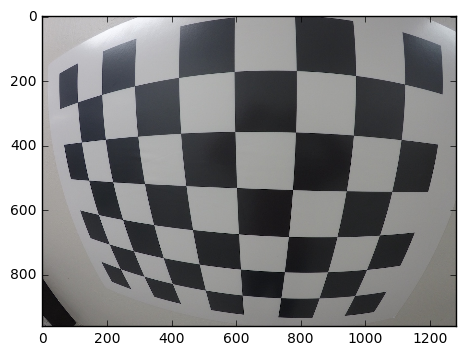

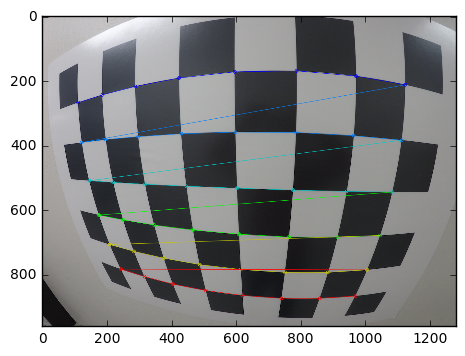

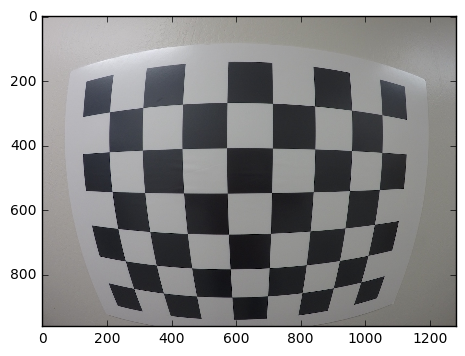

...

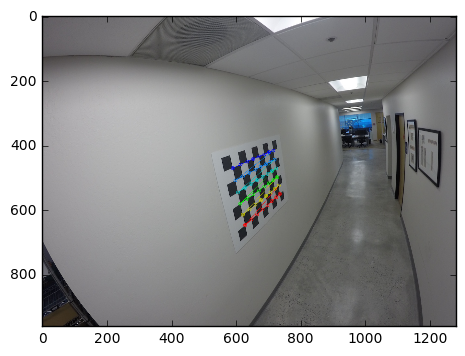

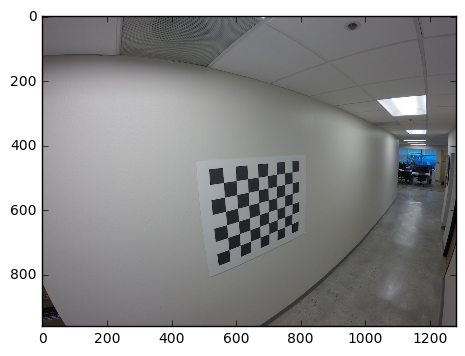

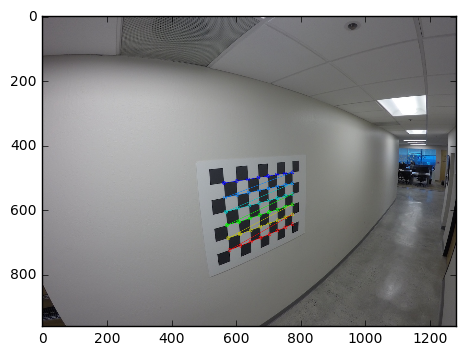

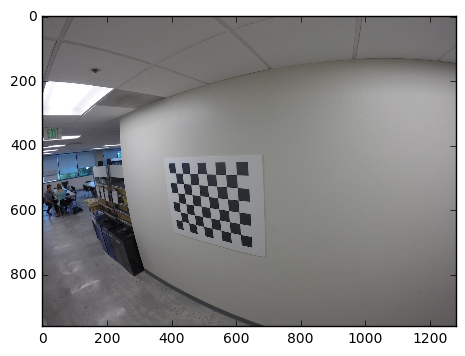

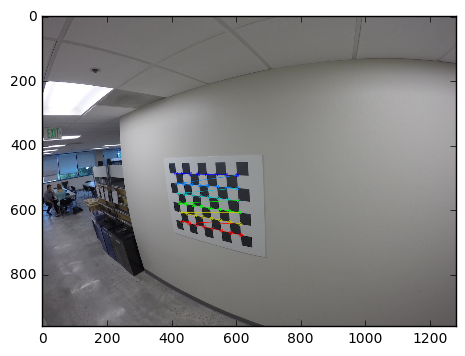

In [3]:
for fname in images:
    img = mpimg.imread(fname)
    plt.imshow(img)
    plt.show()
    
    #converting image to Gray Scale
    gray = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)

    #finding the corners
    ret, corners = cv2.findChessboardCorners(gray, (8,6), None)
    
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

        img = cv2.drawChessboardCorners(img, (8,6), corners, ret)
        plt.imshow(img)
        plt.show()

    else:
        print ("FALSE")

In [4]:
#UnDistort and Perspective Transform

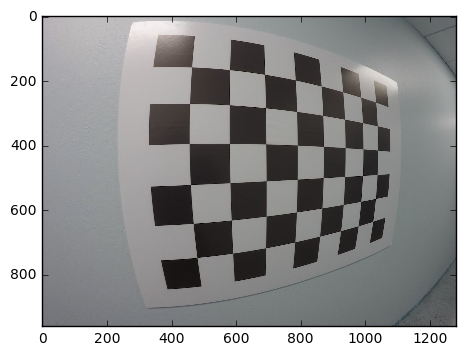

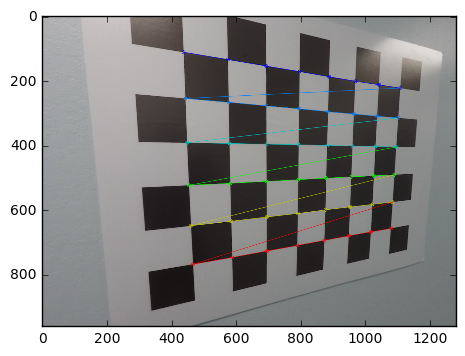

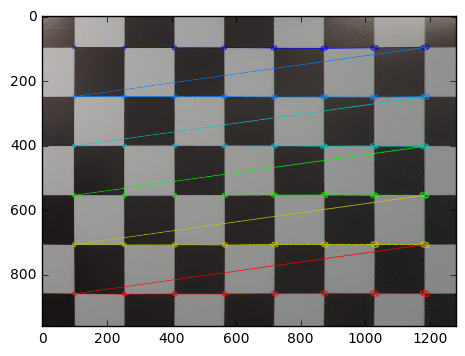

In [23]:
# Test undistortion on an image
img = cv2.imread('camera_cal/perspectiveTransform.jpg')
img_size = (img.shape[1], img.shape[0])

# Do camera calibration given object points and image points
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size,None,None)

plt.imshow(img)
plt.show()

undst = cv2.undistort(img, mtx, dist, None, mtx)


#converting image to Gray Scale
gray = cv2.cvtColor(undst,cv2.COLOR_BGR2GRAY)

#finding the corners
ret, corners = cv2.findChessboardCorners(gray, (8,6), None)

if ret == True:
    offset = 100 # offset for dst points
    # Grab the image shape
    img_size = (gray.shape[1], gray.shape[0])
    
    img = cv2.drawChessboardCorners(undst, (8,6), corners, ret)
    plt.imshow(img)
    plt.show()

    # For source points I'm grabbing the outer four detected corners
    src = np.float32([corners[0], corners[nx-1], corners[-1], corners[-nx]])
    # For destination points, I'm arbitrarily choosing some points to be
    # a nice fit for displaying our warped result 
    # again, not exact, but close enough for our purposes
    dst = np.float32([[offset, offset], [img_size[0]-offset, offset], 
                                         [img_size[0]-offset, img_size[1]-offset], 
                                         [offset, img_size[1]-offset]])
    
    
    # Given src and dst points, calculate the perspective transform matrix
    M = cv2.getPerspectiveTransform(src, dst)
    # Warp the image using OpenCV warpPerspective()
    warped = cv2.warpPerspective(undst, M, img_size)

    cv2.imwrite('camera_cal/perspectiveTransform_result.jpg',warped)



    # Visualize undistortion and perspective transform
    plt.imshow(warped)